<a href="https://colab.research.google.com/github/etesketcck/Proyecto-descriptiva-/blob/main/carlitos_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# *"Análisis global de residuos plásticos: datos del programa Break Free From Plastic (BFFP) 2019-2020"*





## Introducción

En el presente trabajo se realizara un analisis estadistico y gráfico del conjunto de datos seleccionado por la  organización no gubernamental Break Free From Plastico (BFFP), para este trabnajo se usara la erramiento de google colab con el lenguaje de programación de julia. El analisis se hara con las diferentes variables númericas, las cuales en su mayoria representan el número de residuos y su tipo recolectado en las limpiezas.

## Objetivo principal

Analizar estadísticamente los datos de recolección de residuos plásticos registrados por la organización Break Free From Plastic durante los años 2019 y 2020, con el fin de entender cómo se distribuyó la recolección de plásticos entre países, empresas y tipos de material.

## Objetivos especificos

Realizar un análisis descriptivo de las variables numéricas del dataset, calculando medidas de tendencia central y dispersión para cada tipo de plástico recolectado durante los años 2019 y 2020.

Identificar los países y empresas con mayor y menor presencia en los datos de recolección, a través de gráficas y tablas descriptivas.

# Dataset

In [3]:
using Pkg
Pkg.add(["CSV", "DataFrames", "Downloads", "Statistics" , "HTTP" , "StatsBase","Plots",])

using CSV, DataFrames, Downloads, Statistics, HTTP , Plots

url = "https://raw.githubusercontent.com/rfordatascience/tidytuesday/refs/heads/main/data/2021/2021-01-26/plastics.csv"
df = CSV.read(Downloads.download(url), DataFrame)

function safe_int(x)
    result = tryparse(Int, string(x))
    return isnothing(result) ? 0 : result
end

columnas_numericas = [:empty, :hdpe, :ldpe, :o, :pet, :pp, :ps, :pvc, :grand_total, :num_events, :volunteers]

for col in columnas_numericas
    df[!, col] = safe_int.(df[!, col])
end

df[!, :country]        = uppercase.(strip.(string.(df[!, :country])))
df[!, :parent_company] = strip.(string.(df[!, :parent_company]))


df = filter(row -> row.parent_company != "" && row.country != "", df)


df = unique(df)
df = filter(row -> row.country != "GRAND TOTAL", df)
df = filter(row -> row.grand_total > 0, df)


Q1 = quantile(df.grand_total, 0.25)
Q3 = quantile(df.grand_total, 0.75)
IQR = Q3 - Q1
lower = Q1 - 1.5 * IQR
upper = Q3 + 1.5 * IQR

df = filter(row -> row.grand_total >= lower && row.grand_total <= upper, df)

describe(df)

    Updating registry at `~/.julia/registries/General.toml`
   Resolving package versions...
    Updating `~/.julia/environments/v1.12/Project.toml`
  [cd3eb016] + HTTP v1.11.0
  [10745b16] + Statistics v1.11.1
  [2913bbd2] + StatsBase v0.34.10
  [f43a241f] + Downloads v1.7.0
    Manifest No packages added to or removed from `~/.julia/environments/v1.12/Manifest.toml`


Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Union…,Any,Int64,DataType
1,country,,ARGENTINA,,VIETNAM,0,String
2,year,2019.35,2019,2019.0,2020,0,Int64
3,parent_company,,"""Мелочи Жизни"" (Ооо Ергопак)",,脆司令/Cui Siling,0,SubString{String}
4,empty,0.0085999,0,0.0,10,0,Int64
5,hdpe,0.185107,0,0.0,18,0,Int64
6,ldpe,0.383325,0,0.0,18,0,Int64
7,o,1.6236,0,1.0,18,0,Int64
8,pet,0.620346,0,0.0,18,0,Int64
9,pp,0.301101,0,0.0,18,0,Int64


Lo que se hizo en estas primerias lineas de codigo en el trabajo fue llamar e instalar los respectivos paquetes que necesitaremos para hacer los analisis estadisticos en este documento con el comando *"usignpkg"* y luego *"add.pkg"*, lo que hace es que podamos llamar los paquetes que queramos de un forma grupal.

Despues de eso llamamos la base de dato, ya que esta en forma de url ponemos *"URL"* el signno de igual junto con el link donde alacenamos los datos, y para llamar la base de datos los vamos a declarar como *"df"*.

La función *"safe_int"* nos ayuda a convertir cualquier valor entero de forma segura, si este valor que tenemos en el dataset no se puede convertir entonces lo devuelve en cero gracias al *"return"* asi para que no salte algun error.

Ahora el siguiente chunk es conertir las columnas númericas aplicando el *"safe_int"* a cada columan con varaible cuantitativa que serian los plasticos, esto lo que hace es aplicar la función a cada elemento de la columna para correguir datos que no sirvan o influyan para mal ademas de *"!"* y el *"df[",col] ayudan a remplazarlo directamente en el dataframe.

La siguiente linea son las limpiezas de texto para que quede mucho mejor el dataframe y que quede mejor para el programa con comandos como *"string"*, *"strip"* y *"uppercase"* que respectivamente, uno convierte todo a text, el otro elimina espacios vacios, y el otro poner los paises en mayúscula para evitar los duplicados.

Despues de eso se aplican filtros con el comando *"filter"* y *"unique"* sobre la base de datos gracias a la combinación de estos comando y especificando que quite las lineas donde no haya empresas o paises, filas duplicada y resgistro con cero basura.

Y por ultimo en este chunk de limpieza del data set usamos el método del rango intercuartilico para detectar y eliminar los datos atípicos o outliers para cada valor encima o inferior al rango normal hallado en el IQR.


In [4]:
df_limpio = filter(row -> all(coalesce(row[v], 0) > 0 for v in [:hdpe, :ldpe, :o, :pet, :pp, :ps, :pvc]), df)

Row,country,year,parent_company,empty,hdpe,ldpe,o,pet,pp,ps,pvc,grand_total,num_events,volunteers
,String,Int64,SubStrin…,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64


In [5]:
using CSV, DataFrames, HTTP, Statistics

url = "https://raw.githubusercontent.com/rfordatascience/tidytuesday/refs/heads/main/data/2021/2021-01-26/plastics.csv"

df = CSV.read(HTTP.get(url).body, DataFrame, missingstring="NA")

Row,country,year,parent_company,empty,hdpe,ldpe,o,pet,pp,ps,pvc,grand_total,num_events,volunteers
,String,Int64,String,Int64?,Int64?,Int64?,Int64?,Int64?,Int64?,Int64?,Int64?,Int64?,Int64,Int64?
1,Argentina,2019,Grand Total,0,215,55,607,1376,281,116,18,2668,4,243
2,Argentina,2019,Unbranded,0,155,50,532,848,122,114,17,1838,4,243
3,Argentina,2019,The Coca-Cola Company,0,0,0,0,222,35,0,0,257,4,243
4,Argentina,2019,Secco,0,0,0,0,39,4,0,0,43,4,243
5,Argentina,2019,Doble Cola,0,0,0,0,38,0,0,0,38,4,243
6,Argentina,2019,Pritty,0,0,0,0,22,7,0,0,29,4,243
7,Argentina,2019,PepsiCo,0,0,0,0,21,6,0,0,27,4,243
8,Argentina,2019,Casoni,0,0,0,0,26,0,0,0,26,4,243
9,Argentina,2019,Villa Del Sur - Levite,0,0,0,0,19,1,0,0,20,4,243


## Tamaño del dataset

In [6]:
println("Dimensiones: ", size(df))
println("Filas: $(nrow(df)), Columnas: $(ncol(df))")

Dimensiones: (13380, 14)
Filas: 13380, Columnas: 14


en este dataset podemos observar que tiene un tamaño de 13380 lineas de texto pero al momento de usar el codigo julia nos muestra 9535 filas ya que verdaderamente cuenta las filas reales del datset y en columnas encontramos 14 que representan las diferentes variables del dataset.
estos datos representan 69 paises unicos y 10823 empresas unicas productoras de plastico

## variables

In [7]:
describe(df)

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Union…,Any,Int64,Type
1,country,,Argentina,,Vietnam,0,String
2,year,2019.31,2019,2019.0,2020,0,Int64
3,parent_company,,"""ESE""",,脆司令/Cui Siling,0,String
4,empty,0.411759,0,0.0,2208,3243,"Union{Missing, Int64}"
5,hdpe,3.04602,0,0.0,3728,1646,"Union{Missing, Int64}"
6,ldpe,10.3194,0,0.0,11700,2077,"Union{Missing, Int64}"
7,o,49.6136,0,0.0,120646,267,"Union{Missing, Int64}"
8,pet,20.9403,0,0.0,36226,214,"Union{Missing, Int64}"
9,pp,8.2208,0,0.0,6046,1496,"Union{Missing, Int64}"



1.   country: el pais donde se hizo la limpieza
2.   year: año de auditoria (2019 o 2020)
3.   parent_company: emprersa responzable del plastico
4.   empty: plastico sin categoria registrada
5.   hdpe: polietileno de alta densidad(botellas,tapas)
6.   ldpe: polietileno de baja densidad(tubos,bolsas)
7.   o: otros tipos de plastico
8.   pet: Tereftalato de polietileno (botellas de bebida)
9.   pp: Polipropileno (tapas, pajillas, envases)
10.   ps: Poliestireno (icopor, vasos desechables)
11.   pvc: PVC (tuberías, empaques)
12.   grand_total: Total de plásticos contados (0 – 120 646)
13.   num_events: Número de eventos de limpieza realizados
14.   volunteers:	Número de voluntarios participantes

##Tipos de variable representadas en el dataset

1.   country: El pais se encuentra y se reconoce como una variable cualitativa o categorica de tipo nominal, ya que esta variable nos identifica una caracteristica o cualidad, que en este data set, se refiere a los paises donde se hicieron las diferentes limpiezas.
2.   year: El año es una variable de caracter cualitativo y de categoria discreta ya que los años solo se toman en valores enteros, representando los años donde ocurrieron las diferentes limpiezas.
3.   parent_company: Las empresas encargadas del platico, es una variable cualitativa de tipo nominal, representa la empresa que hizo los desechos plastico.
4.   empty: Los plasticos sin categoria registrada es un variable de tipo cuantitativa discreta, ya que esta solo toma valores númericos enteros y no decimales, se registra cada plastico como un entero.
5.   hdpe: El polietileno de alta densidad se considera una variable cuantitativa discreta por lo mismo solo se tomaran valores enteros al encontrar el resiudo.
6.   ldpe: El polietileno de baja densidad es una variable  cuantitativa discreta, donde aqui se toman encuenta las bolsas a base de plastico y los tubos.
7.   o: El o representa un variable cuantitativa discreta, donde toma los valores de otros tipos de plastico recolectados en las limpiezas.
8.   pet: el terefitalato de polietileno, botella de bebida sigue siendo una variable cuantitativa discreta.
9.   pp: polipropileno, representando una cantidad siendo cuantitava discreta tomando las recolectas de icopor y vasos desechables.
10.   ps: El poliestireno es un variable cuantitativa discreta que toma encuenta en las recolectas los icopores y vasos desechables.
11.   pvc: El plastico pvs en este estudio se toma como una variable cuantitativa de caracteristicas discretas, aqui se recolecta los tuvos y empaques con base a este material-
12.   grand_total: El número total de plasticos encontrados en las recolectas representa una variable cuantitativa discreta, donde nos da cuenta del total de residuos encontrados en las limpiezas.
13.   num_events: El número de eventos de limpieza representa una variable cuantitativa discreta, ya que esta variable se representa con números enteros.
14.   volunteers:	Representa las personas que fueron parte de estos eventos se toma encuenta la cantidad de personas que participaron siendo una varibale de tipo cuantitava discreta como la mayoria de este dataset.

### periodo de estudio

La base de datos cubre los años 2019 y 2020, correspondientes a las auditorías de marca organizadas anualmente por Break Free From Plastic (BFFP), en las que voluntarios de distintos países identifican y clasifican los residuos plásticos encontrados en limpiezas de playas, ríos y comunidades. En 2019 se organizaron más de 700 auditorías en 84 países, mientras que en 2020 la iniciativa se extendió a 49 países de 6 continentes, recopilando cerca de 350 000 piezas de plástico.

Cabe aclarar que la participación de países varía entre un año y otro, pues no todos los territorios reportaron datos en ambos períodos, lo que limita las comparaciones directas entre años y debe tenerse en cuenta al momento de interpretar los resultados.

###credibilidad y fuentes

Los datos provienen de Break Free From Plastic (BFFP), una organización no gubernamental global dedicada a combatir la contaminación plástica. Si bien la información es recolectada directamente en campo por voluntarios capacitados, es importante tener en cuenta que BFFP es una organización con una agenda activista declarada, lo que significa que la selección de países y sitios de limpieza no responde a un diseño muestral aleatorio ni representativo a escala mundial. Por tanto, los resultados reflejan la capacidad organizativa local de cada territorio y no necesariamente la realidad global de la contaminación plástica.

A nivel de calidad de los datos, el dataset presenta una cantidad considerable de valores ausentes, especialmente en variables como PVC (4 328 NAs), plásticos sin categoría (3 243 NAs) y polietileno de baja densidad (2 077 NAs), lo que sugiere que no todos los grupos de voluntarios registraron todos los tipos de plástico durante sus auditorías. Esto debe considerarse antes de realizar análisis por tipo de material.

En cuanto a las fuentes, los datos crudos originales fueron recopilados y publicados por BFFP en sus informes anuales de auditoría de marca de 2019 y 2020, disponibles en su portal oficial: https://brandaudit.breakfreefromplastic.org. Posteriormente, fueron curados y estructurados por la analista Sarah Sauvé, y distribuidos a través del proyecto #TidyTuesday de la comunidad de R, cuya documentación oficial puede consultarse en: https://github.com/rfordatascience/tidytuesday/blob/master/data/2021/2021-01-26/readme.md.

# Analisis univariado y bivariado

Para la creación de estas tablas, donde aguarda la información de muchas medidas descriptivas a traves de los dos años de información del dataset. lo primero es saber que necesitaremos un *"begin"* y un *"end"*¨ya que julia tendra que hacer muchos procesos.

Lo primero es hacer una lista donde vamos a tener nuestras variables agrupadas, las cuales son los tipos de plastico que se recolectaron en las campañas de limpieza en lso diferentes paises, ahora le decimos a julia que para todas las variables en la lista de *"vars"* haga lo siguiente: Vamos a declarar que *"t"* es la combinación con el comando *"combine"* y luego con el *"groupby"* me junto todos los años del data frame junto con los analisis descriptivos que quiero en esta tabla.En esta tabla esta la media,mediana,min,max. Y en la otra las medias armonicas y geometrica, junto con el IQR, varianza y desviación estandar.

luego ponemor que *"t=year"* sera el poner los valores del año en texto ya que queremos tenerlos como texto y no como otro dato, despues realizaremos el push de todo es que seria igual al *"Total"*  por año y de todos los datos, además toca poner el *"skipmissing"* para que ignore datos faltantes y poner el *"!,v"* para que lo haga con todas las columnas sacando las medidas descriptivas que solicitamos.

Por ultimo hacer el *"println"* para que nos muestre la tabla que generamos y que no muestre la varaible que hicimos con la combinación de todo el codigo anteriormente explicado.



In [8]:
begin
    vars = [:empty, :hdpe, :ldpe, :o, :pet, :pp, :ps, :pvc, :grand_total]

    for v in vars
        t = combine(groupby(df, :year),
            v => mean∘skipmissing => :media,
            v => median∘skipmissing => :mediana,
            v => minimum∘skipmissing => :min,
            v => maximum∘skipmissing => :max)

        t.year = string.(t.year)
        push!(t, ("Total", mean(skipmissing(df[!, v])), median(skipmissing(df[!, v])), minimum(skipmissing(df[!, v])), maximum(skipmissing(df[!, v]))))

        println("\n=== $v ===")
        show(t)
    end
end


=== empty ===
3×5 DataFrame
 Row │ year    media     mediana  min    max   
     │ String  Float64   Float64  Int64  Int64 
─────┼─────────────────────────────────────────
   1 │ 2019    0.0           0.0      0      0
   2 │ 2020    1.02204       0.0      0   2208
   3 │ Total   0.411759      0.0      0   2208
=== hdpe ===
3×5 DataFrame
 Row │ year    media    mediana  min    max   
     │ String  Float64  Float64  Int64  Int64 
─────┼────────────────────────────────────────
   1 │ 2019    2.4366       0.0      0   3728
   2 │ 2020    4.18756      0.0      0   3209
   3 │ Total   3.04602      0.0      0   3728
=== ldpe ===
3×5 DataFrame
 Row │ year    media     mediana  min    max   
     │ String  Float64   Float64  Int64  Int64 
─────┼─────────────────────────────────────────
   1 │ 2019    10.968        0.0      0  11700
   2 │ 2020     9.17287      0.0      0   5634
   3 │ Total   10.3194       0.0      0  11700
=== o ===
3×5 DataFrame
 Row │ year    media    mediana  min    max 

### analisis media, mediana, minimo y maximo.
### empty
1.   en el año 2019 todos los plasticos entraron en alguna categoria entones la media, la mediana, el minimo y el maximo fueron de 0 en el año 2019 con plasticos sin categoria registrada.
2.   en el año 2020 la media fue de  1.02204 y se vio un incremento ya que fueron registrados mas plasticos sin categoria alguna.en cambio la mediana queo en cero ya que fueron pocos datos registrados el minimo dato registrado sobre la recolecta de plasticos sin categoria fue 0 y el maximo dato registrado fue de 2280.
3.  en total la media del registro de los datos recolectados en los dos dos años fue de 0.411759 la mediana sigue siendo 0 el minimo dato de los dos años sigue siendo 0 y el maximo dato sigue siendo 2280.
### hdpe
1.   en el año 2019 la media fue de 2.4366 segun los datos recolectados de la recolecta de polietireno de alta densidad, la mediana fue de 0, el minimo dato recolectado fue 0 y el maximo dato recolectado fue de 3728.
2.   en el año 2020 la median fue de  4.18756 segun los datos recolectados, la mediana sigue siendo 0, el minimo dato sigue siendo 0 y el maximo dato es de  3209 en este año se registraron menos plasticos de categoria hdpe (polietireno de alta densidad).
3.   en total la media de los dos años de estudio de esta categoria es de  3.04602, la mediana sigue siendo 0, el mijnomo dato reguistrado fue 0 y el maximo dato registrado es ded 3728.
### ldpe
1.   en el año 2019 segun los datos de recoleccion de polietileno de baja densidad, la media de los datos es de  10.968, la mediana es de 0, el dato minimo es de 0 y el dato maximo es de 11700 segun los datos registrados este año.
2.   en el año 2020 la media es de  9.17287, la mediana continua siendo 0, el dato minimo de recoleccion es 0 y el dato maximo este año es de 5634 se ve en una disminucion considerable en los datos registrados de este plastico.
3.  el total en los dos años de recoleccion se vieron que los datos registrados de este plastico tienen una media de  10.3194, una mediana de 0, un dato minimo 0 y un dato maximo de 11700.
### o
1.   en el el 2019 la recoleccion de otros tipos de plastico tuvo una media de  57.386,hubo una mediana de 0, un dato minimo de 0 y un dato maximo de 120646 segun los datos registrados este año.
2.   en el año 2020 se registro segun los datos que la media es de 32.4302, la mediana es de 0, el dato minimo sigue siendo 0 y el dato maximo es de 26705 en este año disminuyo el numero de datos registrados de la recolecta de esta categoria de plastico.
3.    en total la media de todos los datos de los dos años es de  49.6136, la mediana es de 0, el dato minimo es de 0 y el dato maximo es de 120646 en los datos registrados de los plasticos de otro tipo recolectados.
### pet
1.   en el registro de datos registrados de tareftalato de polietireno se puede ver que en el año 2019 hay una media de 21.3385, una mediana de 0, un dato minimo de 0 y un dato maximo de 36226.
2.   en el año 2020 segun los datos registrados hubo una media de  20.0548, una mediana de 0,un dato minimo de 0 y un dato maximo de  17634.
3.   en total en los datos recolectados en el 2019 y 2020 se puede ver una media de 20.9403, una mediana de 0, un dato minimo 0 y un dato maximo de 36226, en el año 2020 se ve una disminucion de la recolecta de tareftelano de polietileno.
### pp
1.   en el registro de datos de la recolecta de polipropileno en el año 2019 se ve una media de 4.61231, una mediana de 0, un dato minimo 0 y un dato maximo 5420
2.   en el año 2020 se ve que la media es de 15.1126, la mediana es de 0,el dato minimo es de 0 y un dato maximo de 6046 segun los datos registrados
3.   en total segun los datos registrados de los dos años se puede ver una media de 8.2208, una mediana de 0,un dato minimo 0 y un dato maximo de 6046 en el año 2020 aumento un poco la recolecta de polipropileno.
### ps
1.   en el 2019 en los datos de la recolecta de poliestireno se registra una media de 1.60841, una mediana de 0, un dato minimo 0 y un dato maximo 2101.
2.   en el año 2020 la media es de  2.31709, la mediana es de 0, el dato minimo es 0 y el dato maximo es de 1319.
3.   en total de los datos registrados entre los años 2019 y 2020 se ve una media de 1.86211, una mediana de 0,un dato minimo 0 y un dato maximo 2101,se ve como vuelve a reducirce los datos de recoleccion de plasticos de la categoria poliestireno en el año 2020.
### pvc
1.   en el año 2019 en la rcolecta de plastico pvc hubo una media de 0.192029,una mediana de 0, un dato minimo de 0 y un dato maximo de 188.
2.  en el año 2020 se puede observar una media de 0.54236, una mediana de 0,un dato minimo de 0 y un dato maximo de 622
3.   el total de los datos se registrados entre los años 2019 y 2020 se puede observar una media de 0.350088, una mediana de 0, un dato minimo de 0 y un dato maximo de 622 plasticos recogidos en los dos años.
### grand total
1.   en el año 2019 la media de todos los plasticos recogidos es de 92.3475, la mediana es de 1, el dato minimo es de 0 y el dato maximo es de 120646
2.   en el año 2020 la media de todos los plasticos recogidos es de 85.1337, la mediana es de 2, el dato minimo es de 0 y el dato maximo de plasticos recogidos en 2020 es de 31331
3.   en total de los dos años de rcolecta de plasticos se observa que la media es de 90.1508, la mediana es de 1, el dato minimo es de 0 y el dato maximo es de 120646 en los años 2019 2020
### observaciones
se puede ver que en total de los dos años se recogieron un total de 151977 plasticos de todas las categorias antes mencionadas, además de eso se puede analizar que el plastico que más se recogio en promedio durante estos dos años fue la variable de otros plasticos, entonces podemos analizar que en su gran mayoria fueron recolectados otros plasticos distintos a los ya antes mencionados durante los eventos.Despues el plastico que en promedio menos se recolecto fue la categoria empty(sin cateogoria), podemos concluir que en en la gran mayoria de recolectas se pudo hacer una categorización correcta de los plasticos, dejando muy pocos afuera de las clases de plasticos antes mencionadas, resaltando una buena classificación de los encargados de la campaña de limpieza de residuos plasticos.
se puede ver como en el año 2020 la cantidad de plasticos recogidos ha

In [9]:
sum(df.hdpe .== 0)

missing

In [10]:
begin
    using StatsBase

    vars = [:empty, :hdpe, :ldpe, :o, :pet, :pp, :ps, :pvc, :grand_total]

    for v in vars
        t = combine(groupby(df, :year),
            v => (x -> geomean(collect(skipmissing(x))))    => :media_geometrica,
            v => (x -> harmmean(collect(skipmissing(x))))   => :media_armonica,
            v => (x -> quantile(collect(skipmissing(x)), 0.75) - quantile(collect(skipmissing(x)), 0.25)) => :iqr,
            v => (x -> var(collect(skipmissing(x))))        => :varianza,
            v => (x -> std(collect(skipmissing(x))))        => :desviacion_estandar)

        t.year = string.(t.year)
        push!(t, ("Total",
            geomean(collect(skipmissing(df[!, v]))),
            harmmean(collect(skipmissing(df[!, v]))),
            quantile(collect(skipmissing(df[!, v])), 0.75) - quantile(collect(skipmissing(df[!, v])), 0.25),
            var(collect(skipmissing(df[!, v]))),
            std(collect(skipmissing(df[!, v])))))

        println("\n=== $v ===")
show(t, allcols=true)

    end
end


=== empty ===
3×6 DataFrame
 Row │ year    media_geometrica  media_armonica  iqr      varianza  desviacion_estandar 
     │ String  Float64           Float64         Float64  Float64   Float64             
─────┼──────────────────────────────────────────────────────────────────────────────────
   1 │ 2019                 0.0             0.0      0.0      0.0                0.0
   2 │ 2020                 0.0             0.0      0.0   1265.77              35.5776
   3 │ Total                0.0             0.0      0.0    510.13              22.5861
=== hdpe ===
3×6 DataFrame
 Row │ year    media_geometrica  media_armonica  iqr      varianza  desviacion_estandar 
     │ String  Float64           Float64         Float64  Float64   Float64             
─────┼──────────────────────────────────────────────────────────────────────────────────
   1 │ 2019                 0.0             0.0      0.0   3165.4               56.2619
   2 │ 2020                 0.0             0.0      0.0   66

### analisis varianaza y deviacion estandar
### empty
1.   en el año 2019 con los plasticos que no entran en niguna categoria hubo una varianza de 0 y una desviacion estandar de 0
2.   en el año 2020 hubo una varianza de 1265.77 y un desviacion estandar de  35.5776.
3.   en total entre los dos años hubo una varianza de 510.13 y una desviacion estanadar de  22.5861 segun los datos registrados entre 2019 y 2020
### hdpe
1.   en el año 2019 se ve un varianza de 3165.4 y una desviacion estandar de 56.2619 en la recolecta de polietileno de alta densidad
2.   en el año 2020 hubo una varianza de 6632.23 y una desviacion estandar de 81.4385.
3.   en total entre los años 2019 y 2020 la varianza es de  4372.26 y la desviacion estandar es de 66.123.
### ldpe
1.   en el año 2019 los datos registrados de polietileno de baja densidad tienen una varianza de 49173.8 y una desviacion estandar de 221.752.
2.   en el año 2020 con los datos registrados se ve una varianza de 17939.4 y una desviacion estandar de 133.938.
3.   en total entre los datos registrados entre el año 2019 y el año 2020 se ve que la varianza es de 37886.3 y una desvicion estandar de 194.644.
### o
1.   los datos registrados de otros tipos de plasticos se ve un  iqr de 2.0,una varianza de 3.59134e6 y una desviacion estandar de 1895.08.
2.   en el año 2020 se ve un iqr de 2.0 una varianza de 3.00234e5 y una desviacion de 547.936
3.   en total de los datos registrados en los años 2019 y 2020 se ve un iqr de 2.0, una varianza de 2.56637e6 y una desviacion estandar de 1601.99
### pet
1.   en el año 2019 en los datos registrados de tareftalato de polietileno se ve un iqr de 0, una varianza de 223846.0 y una deviacion estandar de 473.124.
2.   en el año 2020 se ve un iqr de 1.0, una varianza de 93227.0 y una desviacion estandar de 305.331.
3.   en total de los años 2019 y 2020 segun los datos registrados se ve un iqr de 0, una avarianza  1.83319e5 y una desviacion estandar de 428.158.
### pp
1.   en el año 2019 segun los datos registrados de recolecta de polipropileno se ve una varianza de 8400.75 y una desviacion estandar de 91.6556.
2.   en el año 2020 segun los datos registrados se ve una varianza de 42404.7 y una desviacion estandar de 205.924
3. en total de la recolecta de este plastico en los años 2019 y 2020 de recolecta se va una varianza de 20108.7 y una desviacion estandar de 141.805
### ps
1.   en el año 2019 los datos registrados de la recolecta de poliestireno tienen una varianza de 1617.71 y una desviacion estandar de 40.2208.
2.   en el año 2020 segun los datos registrados hay una varianza de 1509.73 y una desviacion estandar de 38.8553.
3.   en total de los datos registrados en los años 2019 y 2020 se ve una varianza de 1579.03 y una desviacion estandar de 39.7371.
### pvc
1.   en el año 2019 los datos registrados de la recolecta de plastico pvc tienen una varianza de 13.4433 y una desviacion estandar de 3.66651.
2.   en el año 2020 los datos tienen una varianza de 121.727 y una desviacion estandar de 11.033.
3.   en total los datos registrados entre los años 2019 y 2020 tienen una varianza de 62.3199 y una desviacion estandar de 7.8943.
### grand total
1.   en el año 2019 los datos registrados de todas las categorias de plasticos tienen un iqr de 3.0, una varianza de 4.71318e6 y una desviacion estandar de 2170.99
2.   en el año 2020 se ve que los datos registrados tienen un iqr de 9.0, una varianza de 7.64596e5 y una desviacion estandar de 874.412.
3.   el total entre los años 2019 y 2020 se ve un iqr de 5.0, una varianza de 3.51068e6 y una desviacion estandar de 1873.68.


# Gráficos  de dispersión

Ahora para realizar los histogramas de las diferentes variables de la base de datos, lo primero es poner el *"begin"* y saber que el *"end"* va al final, ahora vamos a declarar que *"datos"* dependiendo de la variable que vayamos a usar vamos a usar el filtro de que use solo los valores mayores a 0, para luego poner el *"collect"* con el *"skipmissing"* para que no devuelva el vector normal, y por ultimo especificar en el parentesis el nombre de la base de datos y un punto para especificar la variable a la cual queremos analizar.

Luego va lo más facil que es declarar que queremos hacer un histograma con la palabra *"histogram"* y en un parentesis poner la variable que declaramos en el parrafo anterior y agregarle titulos(*"title"*),titulos a los ejes(*"xlabel"* o *"ylabel"*), la escala de la barras, ya que la escala de los datos son muy grandes por eso toca cambiar la escala con (*"yscale"*), el tamaño de las barras con (*"bins"*) y el dependiendo del número sera el grosor de la barra, y al final el color que queremos que se pinte las barras con el comando (*"color"*). Despuesde poner los comando se poner un signo de igual y lo que queremos de titulos tiene que ir en comillas (") y la escala de Y y el color debe ir con dos puntos (:).

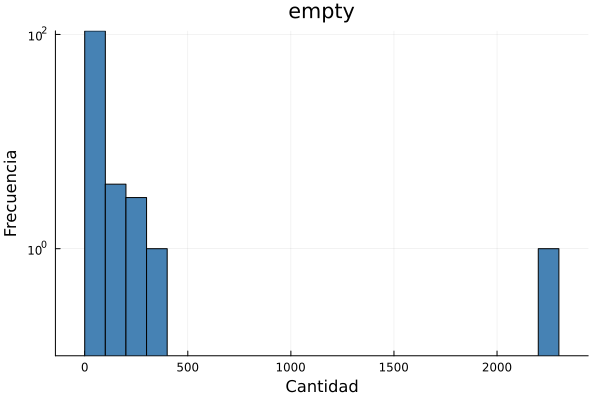

In [11]:
begin
    using Plots

    datos = filter(x -> x > 0, collect(skipmissing(df.empty)))
    histogram(datos,
            title="empty",
            xlabel="Cantidad",
            ylabel="Frecuencia",
            legend=false,
            yscale=:log10,
            bins=30,
            color=:steelblue)
end

El histograma de la variable empty, o plástico no clasificado, nos muestra que los datos presentan un comportamiento inusual o no normal, ya que se puede observar una distribución asimétrica positiva, puesto que la mayoría de los datos se concentra cerca del cero. Esto lo podemos comprobar con los análisis descriptivos realizados anteriormente, donde la media es mayor que la mediana, siendo la mediana igual a cero, lo que confirma dicha asimetría. Por lo tanto, podemos concluir que en la mayoría de los eventos de limpieza se recolectaron pocas o ninguna unidad de plástico sin categoría, lo que sugiere que los voluntarios lograron clasificar correctamente los residuos en la mayoría de los casos. Además, cabe resaltar la existencia de un dato aislado alrededor de las 2200 unidades, el cual puede considerarse un dato atípico u outlier, indicando que en un evento particular se recolectó una cantidad excepcionalmente alta de plásticos sin clasificar.

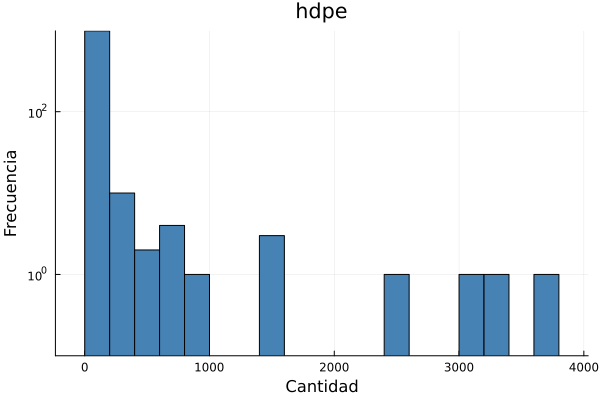

In [12]:
begin
    using Plots

    datos = filter(x -> x > 0, collect(skipmissing(df.hdpe)))
    histogram(datos,
            title="hdpe",
            xlabel="Cantidad",
            ylabel="Frecuencia",
            legend=false,
            yscale=:log10,
            bins=30,
            color=:steelblue)
end

El histograma de la variable hdpe, también conocida como polietileno de alta densidad, presenta igualmente una distribución asimétrica hacia la derecha, ya que en este caso la media es mayor que la mediana, siendo la mediana igual a cero, lo que confirma dicha asimetría. Al igual que en la variable anterior, la mayoría de los eventos de limpieza se concentran en la parte izquierda del histograma, es decir, recolectaron pocas unidades de este tipo de plástico. Sin embargo, a diferencia de empty, esta variable presenta una mayor cantidad de datos atípicos u outliers dispersos a lo largo del eje de cantidad, con valores que alcanzan hasta aproximadamente 3700 unidades, lo que nos indica que en casos puntuales se encontraron cantidades considerablemente más altas de polietileno de alta densidad, haciendo que esta variable sea más irregular que la anterior.

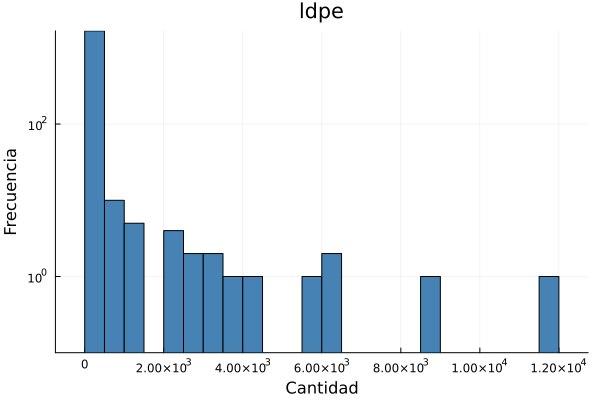

In [13]:
begin
    using Plots

    datos = filter(x -> x > 0, collect(skipmissing(df.ldpe)))
    histogram(datos,
            title="ldpe",
            xlabel="Cantidad",
            ylabel="Frecuencia",
            legend=false,
            yscale=:log10,
            bins=30,
            color=:steelblue)
end

En el histograma de la variable idpe pasa lo mismo tiene una distribución asimetrica por la razón que muchas variables la media es mayor que la mediana, confirmando que tendra un comportamiento irregular o hasta veces impredecible, pero podemos ver en la gráfica que la cantidad de plastico de tipo idpe se encontro en mayor cantidad que muchas otras, e igualmente las barras cercanas al cero representan que en pocos eventos se encontrar cantidades más pequelas que las que se encontraron en los casos puntuales o datos atipicos que se encontrar cantidades gigantescas de plastico en muy pocos eventos.

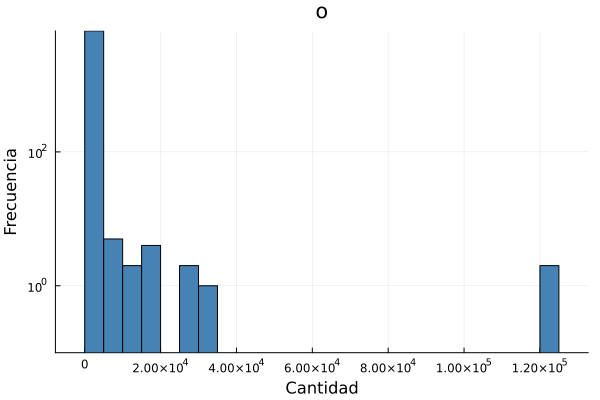

In [14]:
begin
    using Plots

    datos = filter(x -> x > 0, collect(skipmissing(df.o)))
    histogram(datos,
            title="o",
            xlabel="Cantidad",
            ylabel="Frecuencia",
            legend=false,
            yscale=:log10,
            bins=30,
            color=:steelblue)
end

El histograma de la variable o, que representa otros tipos de plástico, presenta igualmente una distribución asimétrica hacia la derecha, confirmada por el hecho de que la media es mayor que la mediana, siendo la mediana igual a cero. La gran mayoría de los eventos se concentran cerca del cero, lo que indica que en la mayoría de los casos se recolectaron pocas unidades de este tipo de plástico. Lo que hace particular a esta variable frente a las anteriores es la escala del eje de cantidad, que llega hasta aproximadamente 120.000 unidades, siendo considerablemente mayor que empty y hdpe. Esto se explica por la presencia de un dato atípico aislado alrededor de esa cifra, indicando que en un evento puntual se recolectó una cantidad excepcionalmente alta, haciendo que la cola derecha de esta distribución sea mucho más extendida que en las variables anteriores.

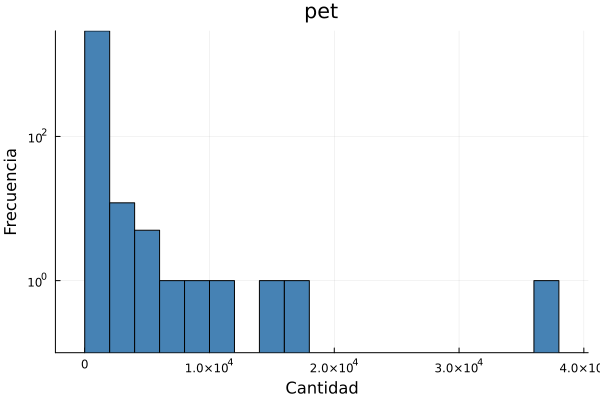

In [15]:
begin
    using Plots

    datos = filter(x -> x > 0, collect(skipmissing(df.pet)))
    histogram(datos,
            title="pet",
            xlabel="Cantidad",
            ylabel="Frecuencia",
            legend=false,
            yscale=:log10,
            bins=30,
            color=:steelblue)
end

El histograma de la variable pet, correspondiente al tereftalato de polietileno, es decir las botellas de bebida, presenta de igual manera una distribución asimétrica hacia la derecha, donde la media supera a la mediana, siendo esta última igual a cero. La concentración de eventos se encuentra cerca del cero, indicando que en la mayoría de limpiezas se recolectaron pocas unidades de este material. Sin embargo, esta variable muestra una característica interesante frente a las anteriores: los datos atípicos no se concentran en un único punto extremo, sino que aparecen de forma más dispersa a lo largo del eje, con valores que alcanzan hasta aproximadamente 40.000 unidades. Esto sugiere que las cantidades altas de plástico tipo pet no son un caso completamente aislado, sino que ocurrieron en varios eventos puntuales, aunque con poca frecuencia.

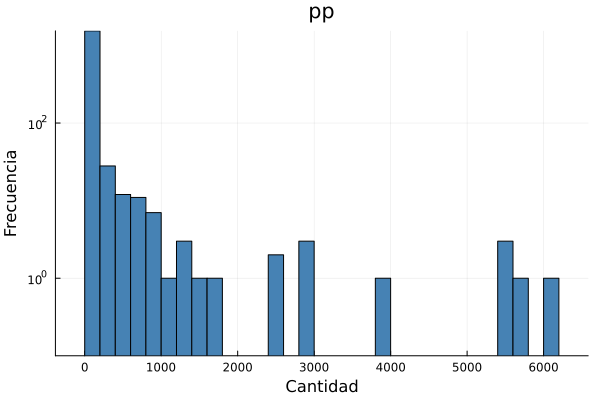

In [16]:
begin
    using Plots

    datos = filter(x -> x > 0, collect(skipmissing(df.pp)))
    histogram(datos,
            title="pp",
            xlabel="Cantidad",
            ylabel="Frecuencia",
            legend=false,
            yscale=:log10,
            bins=30,
            color=:steelblue)
end


El histograma de la variable pp, correspondiente al polipropileno, presente en tapas, pajillas y empaques de alimentos, presenta igualmente una distribución asimétrica hacia la derecha, confirmada por una media mayor que la mediana, siendo esta última igual a cero. La mayoría de los eventos se concentran cerca del cero, manteniendo el patrón observado en todas las variables anteriores. Sin embargo, lo que distingue a esta variable es que presenta la cola derecha más poblada de todas las analizadas hasta el momento, con datos atípicos que aparecen de forma continua y relativamente frecuente a lo largo del eje, alcanzando valores de hasta aproximadamente 6000 unidades. Esto sugiere que el polipropileno es uno de los materiales que con mayor regularidad aparece en cantidades altas durante los eventos de limpieza, lo que podría explicarse por su amplio uso en productos de consumo cotidiano como empaques y utensilios desechables.

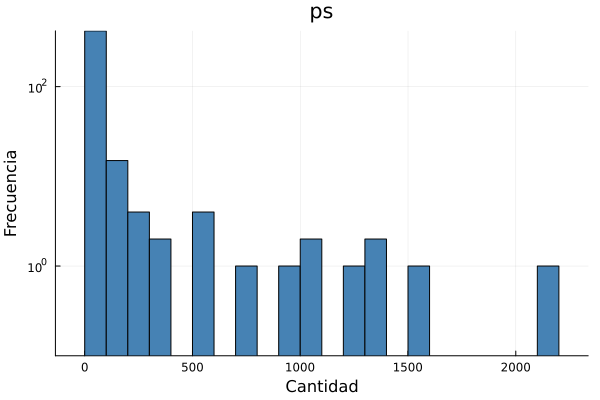

In [17]:
begin
    using Plots

    datos = filter(x -> x > 0, collect(skipmissing(df.ps)))
    histogram(datos,
            title="ps",
            xlabel="Cantidad",
            ylabel="Frecuencia",
            legend=false,
            yscale=:log10,
            bins=30,
            color=:steelblue)
end

"El histograma de la variable ps, correspondiente al poliestireno, como el icopor y los vasos desechables, presenta también una distribución asimétrica hacia la derecha, donde la media supera a la mediana, siendo esta última igual a cero. La mayoría de los eventos se concentran cerca del cero, lo cual es consistente con el comportamiento observado en las variables anteriores. Sin embargo, lo que diferencia a esta variable es que los datos atípicos aparecen de forma mucho más distribuida a lo largo de todo el eje, con barras que se extienden hasta aproximadamente 2200 unidades y que se repiten con cierta regularidad. Esto sugiere que las cantidades altas de poliestireno no son casos tan excepcionales como en otras variables, sino que ocurren con mayor frecuencia relativa, lo que hace que esta distribución sea la más uniforme en su cola derecha de todas las analizadas hasta el momento.

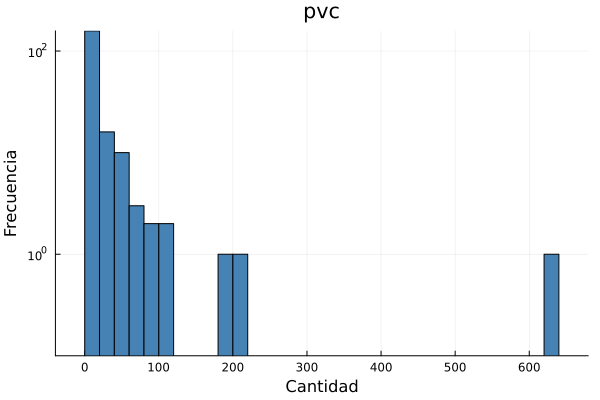

In [18]:
begin
    using Plots

    datos = filter(x -> x > 0, collect(skipmissing(df.pvc)))
    histogram(datos,
            title="pvc",
            xlabel="Cantidad",
            ylabel="Frecuencia",
            legend=false,
            yscale=:log10,
            bins=30,
            color=:steelblue)
end

El histograma de la variable pvc, correspondiente al PVC utilizado en tuberías y empaques, presenta igualmente una distribución asimétrica hacia la derecha, confirmada por una media mayor que la mediana, siendo esta última igual a cero. La concentración de eventos se encuentra cerca del cero, lo que indica que en la mayoría de limpiezas se encontraron pocas unidades de este material. A diferencia de variables como o o pet, la escala de esta variable es considerablemente más pequeña, alcanzando apenas unas 630 unidades en su valor máximo, lo que sugiere que el PVC es uno de los materiales menos recolectados en los eventos de limpieza. Se observa además un dato atípico aislado cerca de las 630 unidades, indicando que en un evento puntual se encontró una cantidad excepcionalmente alta para esta variable, aunque en términos absolutos sigue siendo baja en comparación con los demás tipos de plástico analizados.

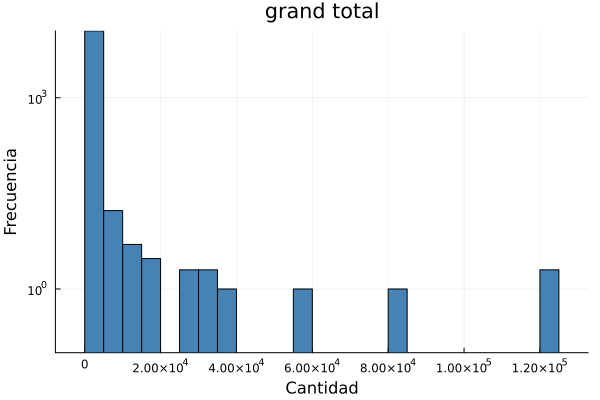

In [19]:
begin
    using Plots

    datos = filter(x -> x > 0, collect(skipmissing(df.grand_total)))
    histogram(datos,
            title="grand total",
            xlabel="Cantidad",
            ylabel="Frecuencia",
            legend=false,
            yscale=:log10,
            bins=30,
            color=:steelblue)
end

El histograma de la variable grand_total, que representa el total de todos los plásticos recolectados en cada evento de limpieza, presenta igualmente una distribución asimétrica hacia la derecha, donde la media supera a la mediana. A diferencia de todas las variables anteriores, esta es la única cuya mediana no es cero sino uno, lo cual tiene sentido ya que al sumar todos los tipos de plástico es muy difícil que un evento de limpieza no encuentre absolutamente ningún residuo. La mayoría de los eventos se concentran cerca del cero, pero la escala de esta variable es la más amplia de todas las analizadas, alcanzando valores de hasta aproximadamente 120.000 unidades, lo que refleja que es la acumulación de todos los tipos de plástico. Se observan además varios datos atípicos dispersos a lo largo del eje, lo que indica que en algunos eventos puntuales se recolectaron cantidades excepcionalmente altas de residuos en total. Esta variable funciona como un resumen del comportamiento general del dataset, confirmando el patrón asimétrico positivo que se ha observado de manera consistente en todas las variables analizadas.

# Analisis bivariado

Para realizar las primeras tres gráficas lo que hicimos fue primero poner el comando de la gráfica que vamos a realizar, el cual sera *"scatter"* para poner el parentesis donde ira todo lo que le vamos agregar a la gráfica, poner el dataset *"df"* con un punto (.) para especificar las variables que queremos analizar, primero le ponemos las etiquetas a las variables con sus respectivos comando *"xlabel"* y *"ylaber"*,seguido de un igual y la etiqueta el comillas, algo parecido con el titulo solo poner el comando *"title"*  y despues del igual el titulo que queremos en comillas.Legend *"legend"* igual a false para quitar la ayuda visual que a veces no aporta nada, por ultimo el tamaño de los puntos con el comando *"markersize"* seguido de un igual y el número que seria el tamaño de los puntos.

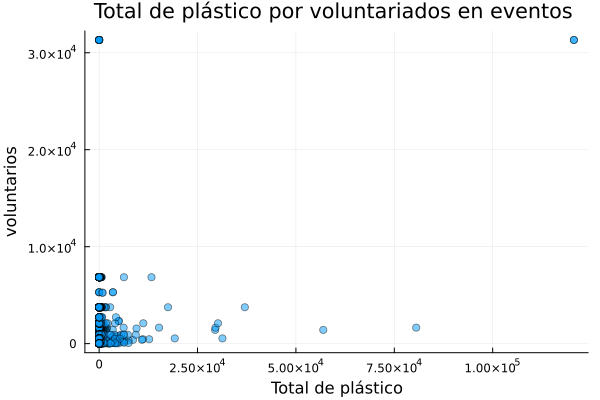

In [20]:
scatter(df.grand_total, df.volunteers,
    xlabel = "Total de plástico",
    ylabel = "voluntarios",
    title = "Total de plástico por voluntariados en eventos ",
    legend = false,
    markersize = 4,
    alpha = 0.5
)

En esta gráfica se hizo el respectivo analisis de la variable voluntarios y total de plasticos, en este podemos analizar que la mayoria de puntos se encuentran cerca del cero, refiriendo que en estos eventos hubieron pocos residuos con pocos voluntarios, pero esto no significa que haya un relación directamente proporcional ya que por la falta de puntos que formen algún patron podemos decir que estas dos variables no tienen relación, además de eso evidenciamos unos datos atipicos, casos particulares donde con pocos voluntarios se hicieron recolectar de plastico considerablemente grandes, y dos casos especificos un evento donde con muchos voluntarios se hizo un recolecta casi minima de desechos plasticos y otro donde con la misma cantidad de voluntarios se hizo la recolecta más grande de ese evento.

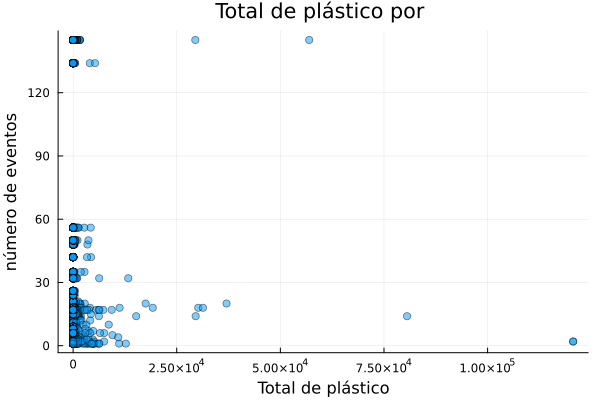

In [21]:
scatter(df.grand_total, df.num_events,
    xlabel = "Total de plástico",
    ylabel = "número de eventos",
    title = "Total de plástico por eventos ",
    legend = false,
    markersize = 4,
    alpha = 0.5
)

En esta gráfoca pasa algo parecido que en la anterior y en la siguiente, las variables que analizamos fueron total de plasticos obtenidos junto a los números de eventos, otra vez vemos que la gran mayoria de los puntos se ubican cerca del cero, a lo que podemos concluir que en la mayoria de estos eventos no se recolecto cantidades grandes de plastico en total, mientras quie vemos casos muy puntales o datos atipicos, vemos que en unos eventos que se observan arriba se hicieron muchos eventos de recolectar pero no recogierón casi desechos plasticos, mientras que tenemos un dato atipico donde se recolecto una cantidad exagerada de plastico con un número de eventos casi llegando al cero, la distribución de los puntos nos da entender que de nuevo estas dos variables no tienen ninguna relación.

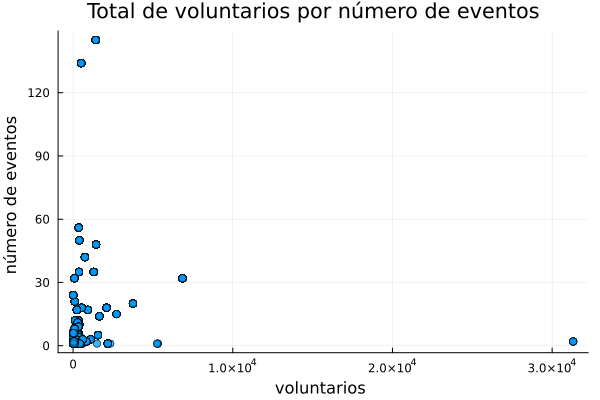

In [26]:
scatter(df.volunteers, df.num_events,
    xlabel = "voluntarios ",
    ylabel = "número de eventos ",
    title = "Total de voluntarios por número de eventos   ",
    legend = false,
    markersize = 4,
    alpha = 0.5
)

En esta gráfica se analizo las variables número de eventos con los participantes o voluntarios de estos eventos, pasa lo mismo en esta ultima gráfica la mayoria de puntos estan cerca del cero, nos dice que en pocos eventos hubieron tambien pocos voluntarios. Pero tenemos los datos atipicos con dos casos, con grandes números de eventos tenemos muy pocos voluntarios y otro donde en poco eventos se tiene el maximo de voluntarios, e igual que las dos anteriores esta no tiene ninguna relación entre sus dos variables por la falta de una forma.

In [23]:
import Pkg
Pkg.add("StatsPlots")

   Resolving package versions...
   Installed Arpack_jll ──────── v3.5.2+0
   Installed Widgets ─────────── v0.6.7
   Installed TableOperations ─── v1.2.0
   Installed Distances ───────── v0.10.12
   Installed StatsPlots ──────── v0.15.8
   Installed MultivariateStats ─ v0.10.4
   Installed Arpack ──────────── v0.5.4
   Installed Clustering ──────── v0.15.8
   Installed NearestNeighbors ── v0.4.27
  Installing 1 artifacts
   Installed artifact Arpack                   138.3 KiB
    Updating `~/.julia/environments/v1.12/Project.toml`
  [f3b207a7] + StatsPlots v0.15.8
    Updating `~/.julia/environments/v1.12/Manifest.toml`
  [7d9fca2a] + Arpack v0.5.4
  [aaaa29a8] + Clustering v0.15.8
  [b4f34e82] + Distances v0.10.12
  [6f286f6a] + MultivariateStats v0.10.4
  [b8a86587] + NearestNeighbors v0.4.27
  [f3b207a7] + StatsPlots v0.15.8
  [ab02a1b2] + TableOperations v1.2.0
  [cc8bc4a8] + Widgets v0.6.7
⌅ [68821587] + Arpack_jll v3.5.2+0
        Info Packages marked with ⌅ have new versions a

### Boxplot empresas que más plastico generaron

Para realizar esta gráfica primero se puso en *"begin"* y saber que al final de la gráfica ponemos el *"end"* luego declaramos un nueva variable que sera *"por_empresa"* que esta va a combinar y agrupart nuestros datos de basura total con las compañias que hicieron los desechos plasticos. Luego escogemos el *"sort"* que ordena la tabla de las empresas de mayor a menor y declaramos un nueva variable con el comando *"first"* despues de un parentesis para escoger las 10 empresar, para luego especificar que estar empresas tienen que ser las diez primeras que más desechan con un *"filter"* para que haga bien la selección. Ya por ultima se especifica que la gráfica que queremos es un *"boxplot"* donde las variables que analizaremos con la que declaramos *"df_top"* y *"df_top.grand_total", lo que sigue son las especificaciones de la gráfica como los titulos, etiquetal, legend y la rotación que fueron anteriormente explicadas.  

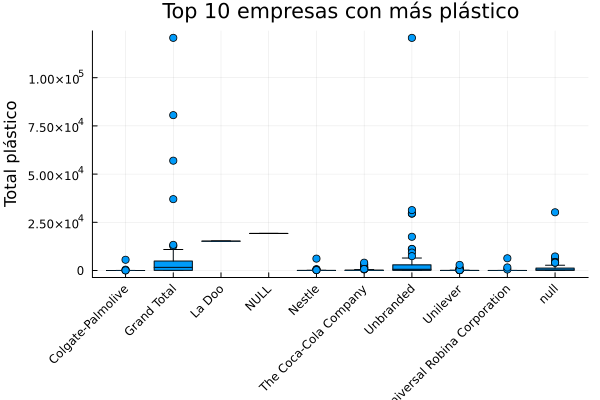

In [24]:
begin
    using StatsPlots

    por_empresa = combine(groupby(df, :parent_company),
        :grand_total => sum∘skipmissing => :total)

    sort!(por_empresa, :total, rev=true)
    top10 = first(por_empresa, 10)

    df_top = filter(row -> row.parent_company in top10.parent_company, df)
    df_top = dropmissing(df_top, :grand_total)

    boxplot(df_top.parent_company, df_top.grand_total,
        title="Top 10 empresas con más plástico",
        xlabel="Empresa",
        ylabel="Total plástico",
        legend=false,
        xrotation=45)
end

El boxplot de las 10 emepresas con más plastico generado en la gran mayoria tienen una mediana de 0 lo que hace que se presenten muchos datos átipicos en toda la gráficas, si no contamos los *"grand total"* y el *"null"*¨tenemos que las empresas que mas presencia en este boxplot fueron Unbramded y The coca-cola company, por lo demás se pueden observar que pueden haber muchos datos átipicos y con una magnitud muy grande, pero podemos identificar las empresas que más desechos plasticos se recolectaron en los eventos.

### boxplot plastico en total por año




Para realizar esta gráfica primero se filtra el DataFrame eliminando las filas donde grand_total tenga valores missing, esto es necesario porque el boxplot no puede trabajar con datos faltantes y causaría un error. Una vez limpios los datos se genera el boxplot donde el eje X muestra los años convertidos a texto con string.() y el eje Y muestra las cantidades de plástico recolectado, permitiendo ver cómo se distribuyen los datos de cada año con su mediana, cuartiles y valores atípicos. Lo que sigue son las especificaciones de la gráfica como el título, etiquetas y la leyenda que fueron anteriormente explicadas.

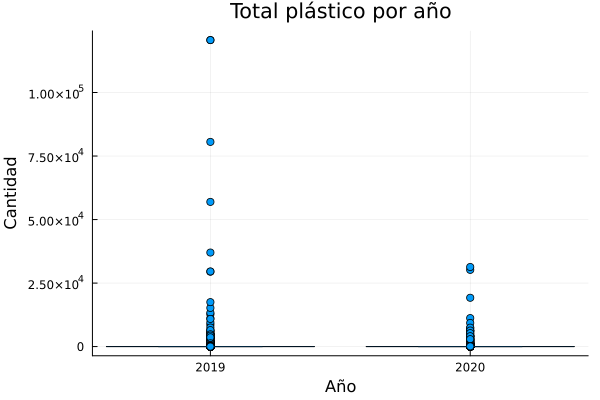

In [25]:
df = filter(row -> !ismissing(row.grand_total), df)

boxplot(string.(df.year), df.grand_total,
        title="Total plástico por año",
        xlabel="Año", ylabel="Cantidad", legend=false)

Luego tenemos el box plot donde analizamos el total de plastico generado a lo largo de los dos años de estudio, podemos decir que es muy poco tiempo para una base de datos pero lo que podemos analizar es que hay un cambio con respecto a los dos años de estudio, en el año 2019 se recolecto muchos desechos plasticos a los largo teniendo un dato átipico que hace referencia a un gran recolecta de este mismo, pero en 2020 bajo diferencialmente la recolecta de plastico con respecto al año anterior, esto puede deberse a que en general no hubo presición en los eventos al momento de albergar los plasticos.

### Mapa

Este mapa se hizo gracias al filtro de columnas y agarrar los paises junto con su variable de grand_total, donde lo que tenemos que por pais los paises que recolectaron los desechos plasticos, este mapa se hizo gracias al excel de google y pasarle las columan precisas del dataframe.

In [28]:
begin
    por_pais = combine(groupby(df, :country),
        :grand_total => sum∘skipmissing => :total)

    sort!(por_pais, :total)
    first(por_pais, 15)
end

Row,country,total
,String,Int64
1,Luxembourg,2
2,Honduras,2
3,United Kingdom,6
4,Armenia,8
5,United Arab Emirates,25
6,Greece,39
7,Cyprus,48
8,Maldives,52
9,Romania,89


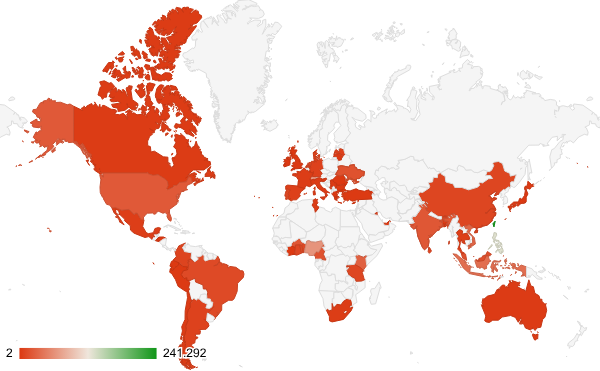

El mapa representa la variable cualitativa pais relacionandola con la variable total de plastico contado. Lo primero que tenemos que aclarar es que los paises cuyo color sea blanco, significa que no estan registrados en ninguna parte del dataset, solo los paises que aparecen en el dataset tienen alguna gama de color representada en la escala de abajo a la izquierda. Ahora lo primero que tenemos que analizar es que en pais con grandes distribuciones de desechos de todo tipo y paises donde generan más residuos gracias a sus procesos de fabrica, son los que tienen menos recolección de desechos plasticos, los paises fueron los que se presentaron en la lista. Y por ultimo reconocemos que el pais con la mayor recolección de desechos plasticos es taiwan que esta al lado de china con un color verde oscuro que tuvo en sus eventos la mayor colecta de residuos plasticos.

# conclusiones

El análisis estadístico del conjunto de datos del programa Break Free From Plastic (BFFP) 2019-2020, desarrollado en Julia, permitió identificar los patrones más relevantes en la recolección global de residuos plásticos.
A nivel univariado, todas las variables numéricas presentaron distribuciones asimétricas positivas con medianas de cero, lo que indica que la mayoría de los eventos de limpieza recolectaron cantidades bajas o nulas de cada tipo de plástico, mientras que eventos puntuales registraron volúmenes excepcionalmente altos. La variable grand_total resume este comportamiento general y fue la única con mediana diferente de cero.
Geográficamente, Taiwán fue el país con mayor recolección total de residuos, mientras que naciones de alta producción industrial mostraron cifras de recolección bajas, lo que refleja no necesariamente menor contaminación, sino menor cobertura del programa en esos territorios.
Es importante señalar que los resultados deben interpretarse con cautela, ya que los datos no corresponden a un muestreo aleatorio representativo y presentan valores ausentes considerables, especialmente en variables como PVC y plásticos sin clasificar, lo que limita la comparabilidad entre tipos de material y entre años.